# Generating Supplementary figure 1D 2 and 3

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import poisson
import seaborn as sns
import pybedtools as pbt
from collections import Counter
import random
from random import Random
from math import ldexp
import json
from collections import Counter
from scipy.stats import poisson
import matplotlib
from matplotlib import pyplot as plt

## Importing TFs data

In [6]:
def import_TF_bed(path, sep=";", header=0):
    df=pd.read_csv(path, sep=sep, header = header)
    df.columns = [x for x in range(df.shape[1])]
    df["middle"] = df[1] + (df[2] - df[1])//2
    df[1] = df["middle"]
    df[2] = df["middle"]
    df = df.drop(["middle"], axis=1)
    df = df[[0,1,2]]
    return df

Nr5a2 = import_TF_bed('./science.abn7478_table_s10.csv')
# Obox data were converted from mm9 to mm10 with https://genome.ucsc.edu/cgi-bin/hgLiftOver
Obox1 = import_TF_bed('./hglft_genome_7e52_b4b220.bed', sep="\t")
Obox5 = import_TF_bed('./hglft_genome_8f25_b4b8c0.bed', sep="\t")
Obox3 = import_TF_bed('./hglft_genome_9296_b4baa0.bed', sep="\t")
Obox15 = pbt.BedTool.intersect(pbt.BedTool.from_dataframe(Obox1), pbt.BedTool.from_dataframe(Obox5), c=True).to_dataframe()
Obox15 = Obox15[["chrom","start","end"]]

Dux_rep1 = import_TF_bed('./rep1_41588_2017_BFng3844_MOESM322_ESM.csv')
Dux_rep2 = import_TF_bed('./rep2_41588_2017_BFng3844_MOESM322_ESM.csv')
Dux = pbt.BedTool.intersect(pbt.BedTool.from_dataframe(Dux_rep1), pbt.BedTool.from_dataframe(Dux_rep2), c=True).to_dataframe()
Dux = Dux[["chrom","start","end"]]


TF1 = Nr5a2
TF2 = Obox3

TF1n = "Nr5a2"
TF2n = "Obox3"

In [7]:
Nr5a2.to_csv('./Nr5a2_peaks.bed', sep=" ", header=None, index=False)
Obox3.to_csv('./Obox3_peaks.bed', sep=" ", header=None, index=False)
Dux.to_csv('./Dux_peaks.bed', sep=" ", header=None, index=False)

/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/ipykernel_11952/834373980.py:7: RuntimeWarning: divide by zero encountered in log10
  df["-log10 Poisson P-value"] = -1*np.log10(np.array([rv.pmf(x) for x in df["Distance"]]))


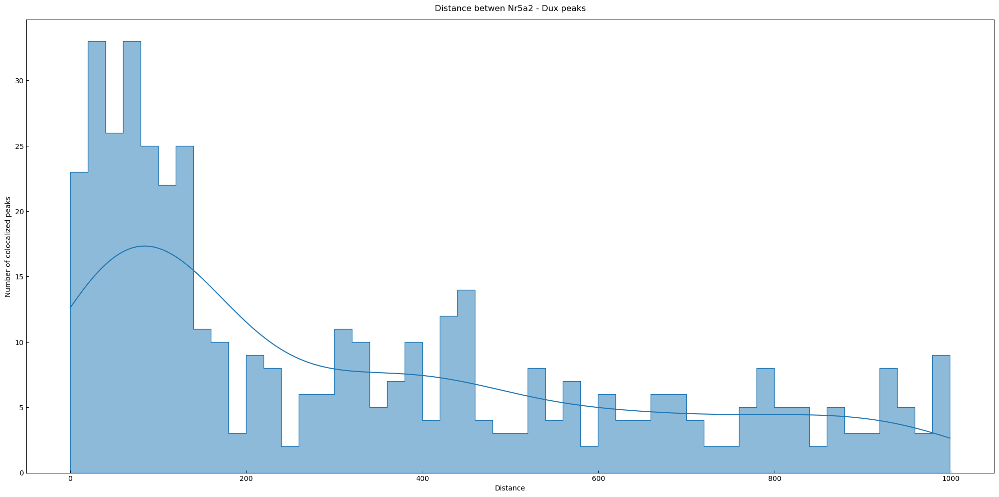

In [8]:
df = pbt.BedTool.from_dataframe(Nr5a2).sort().closest(pbt.BedTool.from_dataframe(Dux).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)
df = df[abs(df[6]) < 1000]
mu = 1
rv = poisson(mu)

df["Distance"] = abs(df[6])
df["-log10 Poisson P-value"] = -1*np.log10(np.array([rv.pmf(x) for x in df["Distance"]]))

sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
matplotlib.rcParams['font.weight'] = "medium"
matplotlib.rcParams['axes.labelweight'] = 'medium'
matplotlib.rcParams['figure.titleweight'] = 'medium'
matplotlib.rcParams['axes.titleweight'] = 'medium'
matplotlib.rcParams['figure.figsize'] = 20, 10
ax = sns.histplot(data=df, x="Distance", bins=50, kde=True, element="step")
ax.set(xlabel='Distance', ylabel='Number of colocalized peaks')
plt.title(f"Distance betwen Nr5a2 - Dux peaks", y=1.01)
plt.tight_layout()
plt.show()

/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/ipykernel_11952/1276192122.py:7: RuntimeWarning: divide by zero encountered in log10
  df["-log10 Poisson P-value"] = -1*np.log10(np.array([rv.pmf(x) for x in df["Distance"]]))


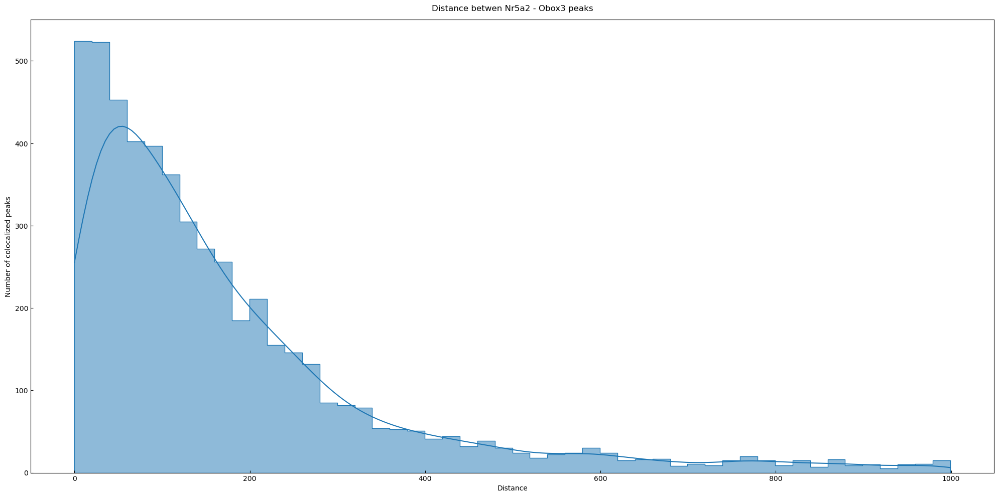

In [9]:
df = pbt.BedTool.from_dataframe(Nr5a2).sort().closest(pbt.BedTool.from_dataframe(Obox3).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)
df = df[abs(df[6]) < 1000]
mu = 1
rv = poisson(mu)

df["Distance"] = abs(df[6])
df["-log10 Poisson P-value"] = -1*np.log10(np.array([rv.pmf(x) for x in df["Distance"]]))

sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
matplotlib.rcParams['font.weight'] = "medium"
matplotlib.rcParams['axes.labelweight'] = 'medium'
matplotlib.rcParams['figure.titleweight'] = 'medium'
matplotlib.rcParams['axes.titleweight'] = 'medium'
matplotlib.rcParams['figure.figsize'] = 20, 10
ax = sns.histplot(data=df, x="Distance", bins=50, kde=True, element="step")
ax.set(xlabel='Distance', ylabel='Number of colocalized peaks')
plt.title(f"Distance betwen Nr5a2 - Obox3 peaks", y=1.01)
plt.tight_layout()
plt.show()

/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/ipykernel_11952/2517709951.py:7: RuntimeWarning: divide by zero encountered in log10
  df["-log10 Poisson P-value"] = -1*np.log10(np.array([rv.pmf(x) for x in df["Distance"]]))


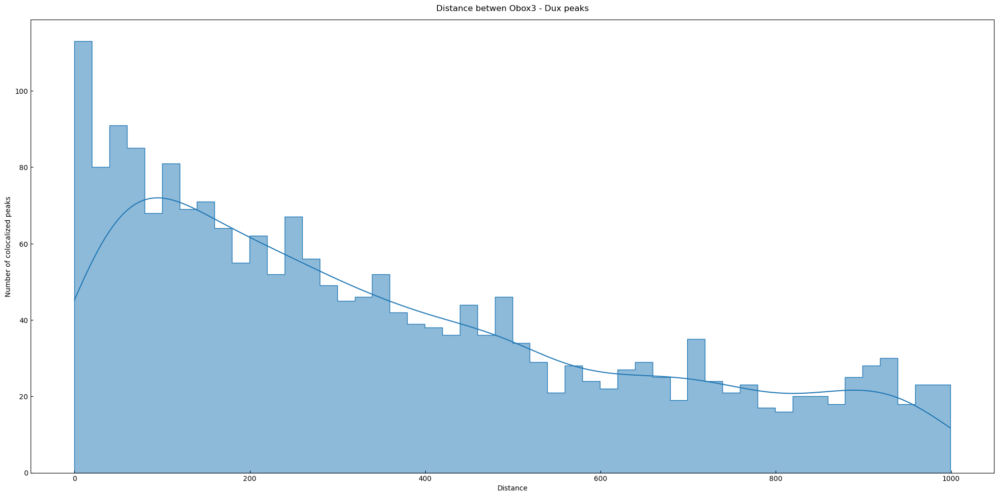

In [10]:
df = pbt.BedTool.from_dataframe(Obox3).sort().closest(pbt.BedTool.from_dataframe(Dux).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)
df = df[abs(df[6]) < 1000]
mu = 1
rv = poisson(mu)

df["Distance"] = abs(df[6])
df["-log10 Poisson P-value"] = -1*np.log10(np.array([rv.pmf(x) for x in df["Distance"]]))

sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
matplotlib.rcParams['font.weight'] = "medium"
matplotlib.rcParams['axes.labelweight'] = 'medium'
matplotlib.rcParams['figure.titleweight'] = 'medium'
matplotlib.rcParams['axes.titleweight'] = 'medium'
matplotlib.rcParams['figure.figsize'] = 20, 10
ax = sns.histplot(data=df, x="Distance", bins=50, kde=True, element="step")
ax.set(xlabel='Distance', ylabel='Number of colocalized peaks')
plt.title(f"Distance betwen Obox3 - Dux peaks", y=1.01)
plt.tight_layout()
plt.show()

## A toy example

In [11]:
dfa = pd.DataFrame({0:["chr1","chr1","chr1"], 1:[1,2,9], 2:[4,5,9]})

dfb = pd.DataFrame({0:["chr1","chr1","chr1"], 1:[1,2,3], 2:[1,5,6]})

pbtdf1 = pbt.BedTool.from_dataframe(dfa)
pbtdf2 = pbt.BedTool.from_dataframe(dfb)
pbtdf1.closest(pbtdf2, t="all", D="a").to_dataframe(disable_auto_names=True, header=None)


,0,1,2,3,4,5,6
0,chr1,1,4,chr1,1,1,0
1,chr1,1,4,chr1,2,5,0
2,chr1,1,4,chr1,3,6,0
3,chr1,2,5,chr1,2,5,0
4,chr1,2,5,chr1,3,6,0
5,chr1,9,9,chr1,3,6,-3


## Generating a simulated distribution

In [12]:
class FullRandom(Random):
    # From https://docs.python.org/3/library/random.html
    def random(self):
        mantissa = 0x10_0000_0000_0000 | self.getrandbits(52)
        exponent = -53
        x = 0
        while not x:
            x = self.getrandbits(32)
            exponent += x.bit_length() - 32
        return ldexp(mantissa, exponent)

fr = FullRandom() 
pbtdf1 = pbt.BedTool.from_dataframe(TF1).sort()
pbtdf2 = pbt.BedTool.from_dataframe(TF2).sort()
collector_list = []
N=1000
for i in range(N): # Memory intensive with hight N
    if i%100 == 0:
        print(i)
    pbtdf1 = pbtdf1.shuffle(genome='mm10', chrom=True, seed=round(fr.random()*10**5, 4)).sort()
    pbtdf2 = pbtdf2.shuffle(genome='mm10', chrom=True, seed=round(fr.random()*10**5, 4)).sort()
    closest_df = pbtdf1.closest(pbtdf2, t="all", D="a").to_dataframe(disable_auto_names=True, header=None)
    collector_list.append(Counter(abs(closest_df[6])))  
    
# with open(f'simulated_distances_{TF1n}_{TF2n}.json', 'w') as fp:
#     json.dump(collector_list, fp)

0
100
200
300
400
500
600
700
800
900


In [13]:
def recalculare_dict(df_tmp):
    df_tmp_out = pd.DataFrame({"Keys":df_tmp.keys(), "Values":df_tmp.values()})
    return df_tmp_out


simulated_distances_df = pd.DataFrame()
for df_tmp in collector_list:
    simulated_distances_df=pd.concat([simulated_distances_df, recalculare_dict(df_tmp)])
    
simulated_distances_df["Keys"] = [int(x) for x in simulated_distances_df["Keys"]]
df_sorted = simulated_distances_df.sort_values("Keys", ascending=True)

simulated_distances_df_sorted_grouped = df_sorted.groupby('Keys', as_index=False).agg(Values_sum = ('Values', sum),
                                                  Values_mean = ('Values', np.mean),
                                                  Values_median = ('Values', np.median),
                                                  Values_std = ('Values', np.std))

## Comparing simulation to the real data

In [14]:
def caclulate_poisson(df):
    
    df["distance"] = abs(df[6])
    Counter_df = Counter(df["distance"])
    d_compare = {}

    for i in list(Counter_df.keys()):
        if i not in list(d_compare.keys()):
            d_compare[i] = Counter_df[i]
        else:
            d_compare[i] = d_compare[i] + Counter_df[i]

    df_tmp = pd.DataFrame({"Keys":d_compare.keys(), "Values":d_compare.values()})
    df_tmp = df_tmp.sort_values("Keys", ascending=True)
    df_tmp = df_tmp[df_tmp["Keys"] < 1000]
    df_tmp["-log10 Poisson P-value"] = -1 * np.array([poisson(list(simulated_distances_df_sorted_grouped[x == simulated_distances_df_sorted_grouped["Keys"]]["Values_mean"])[0]).logpmf(d_compare[x]) if x in simulated_distances_df_sorted_grouped["Keys"] else 0 for x in df_tmp["Keys"]])
    df_tmp = df_tmp.reset_index(drop=True)

    df_poisson = []
    pval = [int(x) for x in np.array(df_tmp["-log10 Poisson P-value"])]
    for i in range(df_tmp.shape[0]):
        key_list_i = list(df_tmp["Keys"])[i]
        for j in range(pval[i]):
            df_poisson.append(key_list_i)

    return df_poisson

In [15]:
df_real = pbt.BedTool.from_dataframe(TF1).sort().closest(pbt.BedTool.from_dataframe(TF2).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)
df_shuffle = pbt.BedTool.from_dataframe(TF1).sort().closest(pbt.BedTool.from_dataframe(TF2).sort().shuffle(genome='mm10', chrom=True).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)

df_poisson_real = caclulate_poisson(df_real)
df_poisson_shuffle = caclulate_poisson(df_shuffle)

In [16]:
df_poisson_h_all = df_poisson_real + df_poisson_shuffle
df_poisson_h_alln = [f"{TF1n}/{TF2n}"]*len(df_poisson_real) + ["Control"] * len(df_poisson_shuffle)

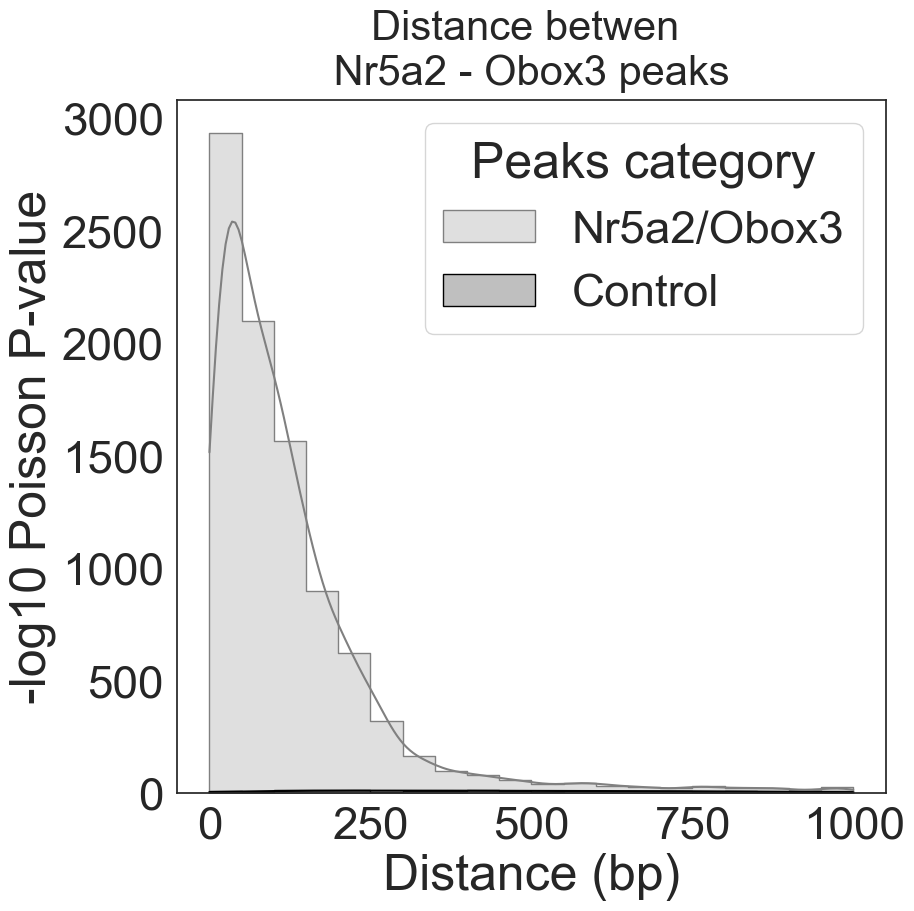

In [17]:
sns.set_theme(style="whitegrid",font_scale=3)
sns.set_style("white")
matplotlib.rcParams['font.weight'] = "medium"
matplotlib.rcParams['axes.labelweight'] = 'medium'
matplotlib.rcParams['figure.titleweight'] = 'medium'
matplotlib.rcParams['axes.titleweight'] = 'medium'
matplotlib.rcParams['figure.figsize'] = 10, 10

dfff = pd.DataFrame({"x":df_poisson_h_all, "Peaks category":df_poisson_h_alln})
dfff = dfff[dfff["x"] < 1000]

ax = sns.histplot(data=dfff, x="x", hue="Peaks category", bins=20, kde=True, element="step", palette=["gray", "black"])
ax.set(xlabel='Distance (bp)', ylabel='-log10 Poisson P-value')
plt.title(f"Distance betwen \n {TF1n} - {TF2n} peaks ", fontsize=30, y=1.01)
plt.tight_layout()
out_pdf = f"./{TF1n}_peak_{TF2n}_peak.pdf"
plt.savefig(out_pdf)
plt.show()

In [18]:
# Importing mm10_repeatmasker table
mm10_repeatmasker = pd.read_csv('../../mm10_repeatmasker.csv',sep="\t")
mm10_repeatmasker.columns = ['#bin', 'swScore', 'milliDiv', 'milliDel', 'milliIns', 'genoName',
       'genoStart', 'genoEnd', 'genoLeft', 'strand', 'repName', 'repClass',
       'repFamily', 'repStart', 'repEnd', 'repLeft', 'id']
mm10_repeatmasker = mm10_repeatmasker[["genoName","genoStart","genoEnd","strand","repName","repClass","repFamily"]].dropna()
mm10_repeatmasker = mm10_repeatmasker[[True if len(chromosome)<6 else False for chromosome in list(mm10_repeatmasker["genoName"])]]

In [19]:
mm10_repeatmasker[mm10_repeatmasker["repFamily"] == "Alu"].to_csv('../../mm10_repeatmasker.bed', sep=" ", header=None, index=False)

In [20]:
def caclulate_poisson_p(df):
    
    df["distance"] = abs(df[6])
    Counter_df = Counter(df["distance"])
    d_compare = {}

    for i in list(Counter_df.keys()):
        if i not in list(d_compare.keys()):
            d_compare[i] = Counter_df[i]
        else:
            d_compare[i] = d_compare[i] + Counter_df[i]

    df_tmp = pd.DataFrame({"Keys":d_compare.keys(), "Values":d_compare.values()})
    df_tmp = df_tmp.sort_values("Keys", ascending=True)
    df_tmp = df_tmp[df_tmp["Keys"] < 1000]
    df_tmp["-log10 Poisson P-value"] = -1 * np.array([poisson(list(simulated_distances_df_sorted_grouped[x == simulated_distances_df_sorted_grouped["Keys"]]["Values_mean"])[0]).logpmf(d_compare[x]) if x in simulated_distances_df_sorted_grouped["Keys"] else 0 for x in df_tmp["Keys"]])
    df_tmp = df_tmp.reset_index(drop=True)

    return df_tmp

In [21]:
# Calculating overlap and number of RE
df_poisson = pbt.BedTool.from_dataframe(TF1).sort().closest(pbt.BedTool.from_dataframe(TF2).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)

df_poisson["distance"] = abs(df_poisson[6])
df_closest = df_poisson[(df_poisson["distance"] < 100)]
df_closest = df_closest[[0,1,2]]

pbt_df_rep = pbt.BedTool.from_dataframe(mm10_repeatmasker)
pbt_df_peaks = pbt.BedTool.from_dataframe(df_closest)
pbt_df_int = pbt.BedTool.intersect(pbt_df_peaks, pbt_df_rep, wb=True, v=False)

pbt_df_int = pbt_df_int.to_dataframe()
pbt_df_int = pbt_df_int.drop_duplicates()
rep_count = pbt_df_int.groupby(['blockCount']).size().reset_index(name='counts').sort_values("counts", ascending=False)
rep_count["counts_norm"] = rep_count["counts"]/df_closest.shape[0]*100

In [22]:
df_closest.to_csv(f"df_closest_{TF1n}_peak_{TF2n}_peak.bed", header=None, index=False)

In [23]:
rep_count = rep_count.replace("Alu", "SINE B1/Alu")

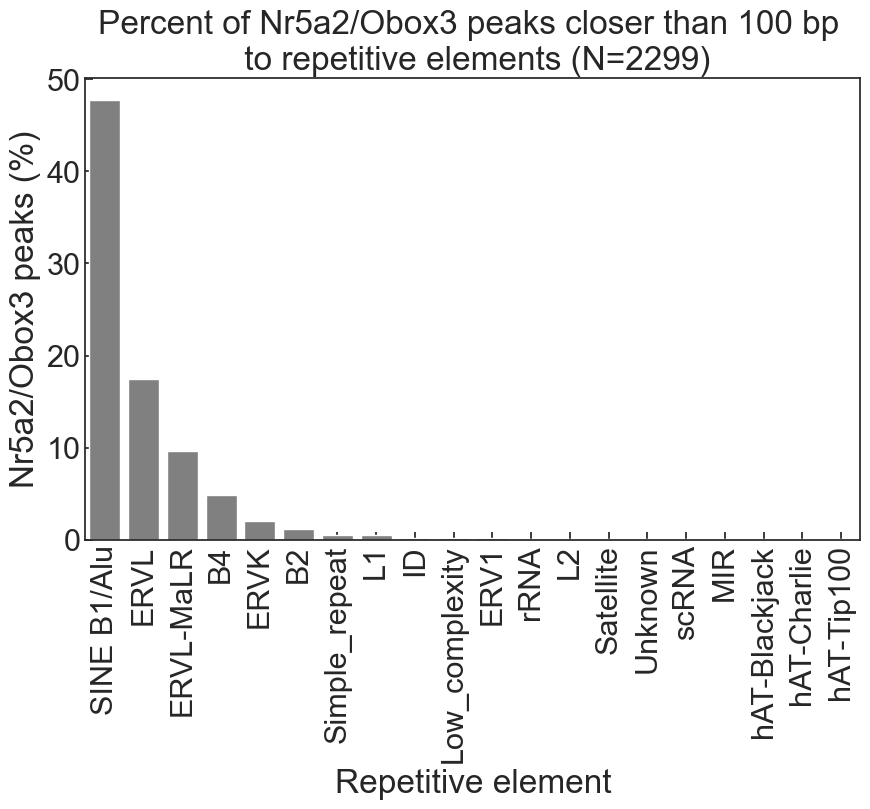

In [25]:
sns.set(font_scale=2, style="ticks")
sns.set_style({"xtick.direction": "in","ytick.direction": "in"})
matplotlib.rcParams['font.weight'] = "medium"
matplotlib.rcParams['axes.labelweight'] = 'medium'
matplotlib.rcParams['figure.titleweight'] = 'medium'
matplotlib.rcParams['axes.titleweight'] = 'medium'
matplotlib.rcParams['figure.figsize'] = 10, 6

ax = sns.barplot(x="blockCount", y="counts_norm", data=rep_count, color="gray")
plt.xticks(rotation=90)

ax.set(xlabel='Repetitive element', ylabel=f'{TF1n}/{TF2n} peaks (%)')
plt.title(f"Percent of {TF1n}/{TF2n} peaks closer than 100 bp \n to repetitive elements (N={df_closest.shape[0]})")

out_pdf = f"./{TF1n}_peak_{TF2n}_peak_by_rep_element.pdf"
plt.savefig(out_pdf)
plt.show()

In [26]:
print(f"Percentage of total peaks {TF1n}/{TF2n}:", df_closest.shape[0]/TF1.shape[0]*100, df_closest.shape[0]/TF2.shape[0]*100)

Percentage of total peaks Nr5a2/Obox3: 26.860614557775442 7.157534246575342


In [1]:
TF1

NameError: name 'TF1' is not defined

In [77]:
# close peaks
df_poisson = pbt.BedTool.from_dataframe(TF1).sort().closest(pbt.BedTool.from_dataframe(TF2).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)

df_poisson["distance"] = abs(df_poisson[6])
df_closest = df_poisson[(df_poisson["distance"] < 250)]
df_closest1 = df_closest[[0,1,2]]

df_poisson = pbt.BedTool.from_dataframe(TF2).sort().closest(pbt.BedTool.from_dataframe(TF1).sort(), t="all", D="a").to_dataframe(disable_auto_names=True, header=None)

df_poisson["distance"] = abs(df_poisson[6])
df_closest = df_poisson[(df_poisson["distance"] < 250)]
df_closest2 = df_closest[[0,1,2]]


df_closest1, df_closest2

(         0          1          2
 0     chr1    4793029    4793029
 7     chr1    6161346    6161346
 9     chr1    7032230    7032230
 22    chr1   13083965   13083965
 23    chr1   13664562   13664562
 ...    ...        ...        ...
 8554  chrX  165760131  165760131
 8555  chrX  168683350  168683350
 8556  chrX  168701545  168701545
 8557  chrX  168770057  168770057
 8558  chrX  169375730  169375730
 
 [4121 rows x 3 columns],
           0         1         2
 9      chr1   4792874   4792874
 40     chr1   6161517   6161517
 50     chr1   7032319   7032319
 103    chr1  13083889  13083889
 118    chr1  13664545  13664545
 ...     ...       ...       ...
 32115  chrY    976459    976459
 32116  chrY   1036862   1036862
 32117  chrY   1037744   1037744
 32118  chrY   1079939   1079939
 32119  chrY   2044848   2044848
 
 [4126 rows x 3 columns])

In [78]:
df1 = pbt.BedTool.from_dataframe(df_closest2)
df2 = pbt.BedTool.from_dataframe(TF2)
pbt_df_int = pbt.BedTool.intersect(df2, df1, v=True).to_dataframe()
pbt_df_int["start"] = pbt_df_int["start"] - 100
pbt_df_int["end"] = pbt_df_int["end"] + 100


import pybedtools as pbt
fasta = pbt.example_filename('/Users/pavel/Desktop/Rise_and_SINE/mm10.fa')

c = pbt.BedTool.from_dataframe(pbt_df_int).slop(g=pbt.chromsizes('mm10'), b=100)
train_fasta = c.sequence(fi=fasta, name=True, s=True)
train_fasta.save_seqs(f"./mm10_Obox3_nopeak.fasta")
    

<BedTool(/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/pybedtools.rymt8rz6.tmp)>

In [79]:
df_closest2[1] = df_closest2[1] - 100
df_closest2[2] = df_closest2[2] + 100


import pybedtools as pbt
fasta = pbt.example_filename('/Users/pavel/Desktop/Rise_and_SINE/mm10.fa')

c = pbt.BedTool.from_dataframe(df_closest2).slop(g=pbt.chromsizes('mm10'), b=100)
train_fasta = c.sequence(fi=fasta, name=True, s=True)
train_fasta.save_seqs(f"./mm10_Nr5a2_Obox3_Obox3_peaks.fasta")
    

/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/ipykernel_11952/3143621726.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_closest2[1] = df_closest2[1] - 100
/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/ipykernel_11952/3143621726.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_closest2[2] = df_closest2[2] + 100


<BedTool(/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/pybedtools.vsk0xs78.tmp)>

In [80]:
df1 = pbt.BedTool.from_dataframe(df_closest1)
df2 = pbt.BedTool.from_dataframe(TF1)
pbt_df_int = pbt.BedTool.intersect(df2, df1, v=True).to_dataframe()
pbt_df_int["start"] = pbt_df_int["start"] - 100
pbt_df_int["end"] = pbt_df_int["end"] + 100


import pybedtools as pbt
fasta = pbt.example_filename('/Users/pavel/Desktop/Rise_and_SINE/mm10.fa')

c = pbt.BedTool.from_dataframe(pbt_df_int).slop(g=pbt.chromsizes('mm10'), b=100)
train_fasta = c.sequence(fi=fasta, name=True, s=True)
train_fasta.save_seqs(f"./mm10_Nr5a2_nopeak.fasta")
    

<BedTool(/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/pybedtools.qiput50s.tmp)>

In [81]:
df_closest1[1] = df_closest1[1] - 100
df_closest1[2] = df_closest1[2] + 100


import pybedtools as pbt
fasta = pbt.example_filename('/Users/pavel/Desktop/Rise_and_SINE/mm10.fa')

c = pbt.BedTool.from_dataframe(df_closest1).slop(g=pbt.chromsizes('mm10'), b=100)
train_fasta = c.sequence(fi=fasta, name=True, s=True)
train_fasta.save_seqs(f"./mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta")
    

<BedTool(/var/folders/fz/qb92b10d6d18gb2mcr1t_ls80000gq/T/pybedtools.c4mjad_y.tmp)>

In [92]:
from Bio.Seq import Seq
#from Bio.Alphabet import IUPACUnambiguousDNA

#consensus_dict = {}

def READ_FASTA_TO_DICT(file_name):
    import sys
    consensus_dict = {}
    with open(file_name) as file_one:
        for line in file_one:
            line = line.strip()
            if not line:
                continue
            if line.startswith(">"):
                active_sequence_name = line[1:].split(" ")[0]
                if active_sequence_name not in consensus_dict:
                    consensus_dict[active_sequence_name] = ""
                continue
            sequence = line
            consensus_dict[active_sequence_name] = consensus_dict[active_sequence_name] + sequence
    return consensus_dict

def READ_FASTA_TO_DICT_WITH_GROUND(file_name):
    import sys
    consensus_dict = {}
    with open(file_name) as file_one:
        for line in file_one:
            line = line.strip()
            if not line:
                continue
            if line.startswith(">"):
                active_sequence_name = line[1:].split(" ")[0]
                if active_sequence_name not in consensus_dict:
                    consensus_dict[active_sequence_name] = ""
                continue
            sequence = line
            consensus_dict[active_sequence_name] = consensus_dict[active_sequence_name] + sequence
    return consensus_dict


#consensus_dict = READ_FASTA_TO_DICT("./mm10_repeatmasker_Alu_sequences_AluYa5.fasta")
#print(consensus_dict)



In [83]:
import subprocess

line = " awk \'/^>/ {FILENAME=100;printf(\">%s\\n\",FILENAME);next;} {print}\' mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta > mm10_Nr5a2_Obox3_Nr5a2_peaks_chipmunck.fasta"
#print(line)
p = subprocess.Popen(line, shell=True)
p.wait()

0

In [84]:
import subprocess

line = " awk \'/^>/ {FILENAME=100;printf(\">%s\\n\",FILENAME);next;} {print}\' mm10_Nr5a2_Obox3_Obox3_peaks.fasta > mm10_Nr5a2_Obox3_Obox3_peaks_chipmunck.fasta"
#print(line)
p = subprocess.Popen(line, shell=True)
p.wait()

0

In [85]:
import subprocess

line = " awk \'/^>/ {FILENAME=100;printf(\">%s\\n\",FILENAME);next;} {print}\' mm10_Nr5a2_nopeak.fasta > mm10_Nr5a2_nopeak_chipmunck.fasta"
#print(line)
p = subprocess.Popen(line, shell=True)
p.wait()

0

In [86]:
import subprocess

line = " awk \'/^>/ {FILENAME=100;printf(\">%s\\n\",FILENAME);next;} {print}\' mm10_Obox3_nopeak.fasta > mm10_Obox3_nopeak_chipmunck.fasta"
#print(line)
p = subprocess.Popen(line, shell=True)
p.wait()

0

# Chipmunck

In [7]:
%%bash 

#!/usr/bin/env bash
set -eu
#set -o pipefail

NUM_PROCESSES=1 # be careful with processor number on PC. Requires ~ 7 Gb of RAM
WEIGHTING_MODE="s" # m=peak summit, s=simple sequence
NUM_INNER_THREADS=4 # to apeed up the setup. More that 4 will not help much.
ADDITIONAL_OPTIONS=""


OUT_DIR="./chipmunk"
mkdir -p $OUT_DIR 

for LENGTH_RANGE in "100 100"; do #setting motif lengths 
        echo $LENGTH_RANGE
    for FILE in $(find "./sequences_for_motif_discovery" -type f); do
        FILE_NAME="$(basename -s .fa "$FILE")"
                mkdir -p "${OUT_DIR}/chiphorde_flat_${FILE_NAME}_$(echo -e "${LENGTH_RANGE}" | tr " " _)"
                mkdir -p "${OUT_DIR}/chipmunk_log_flat_${FILE_NAME}_$(echo -e "${LENGTH_RANGE}" | tr " " _)"
                mkdir -p "${OUT_DIR}/chipmunk_res_flat_${FILE_NAME}_$(echo -e "${LENGTH_RANGE}" | tr " " _)"

                #random auto flat
        echo "ruby /Users/pavel/Desktop/Rise_and_SINE/chipmunk_scripts_v8upd/run_chiphorde8.rb  ${OUT_DIR}/chiphorde_flat_${FILE_NAME}_$(echo -e "${LENGTH_RANGE}" | tr " " _)/${FILE_NAME}_$(echo -e "${LENGTH_RANGE}" | tr " " _) $(echo -e "${LENGTH_RANGE}" | tr " " :),$(echo -e "${LENGTH_RANGE}" | tr " " :)" \
        "filter y 1.0 ${WEIGHTING_MODE}:${FILE} 400 40 1 ${NUM_INNER_THREADS} random auto flat ${ADDITIONAL_OPTIONS}" \
        "> ${OUT_DIR}/chipmunk_res_flat_${FILE_NAME}_$(echo -e "${LENGTH_RANGE}" | tr " " _)/${FILE_NAME}.txt" \
        "2> ${OUT_DIR}/chipmunk_log_flat_${FILE_NAME}_$(echo -e "${LENGTH_RANGE}" | tr " " _)/${FILE_NAME}.log"
        done | parallel -j ${NUM_PROCESSES} 
done


100 100
Process is interrupted.


# Streme

In [ ]:
%%bash

cd /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/

mkdir streme

nmotifs=10
minw=6
maxw=30

for markov_order in 0 1 2 3 4 5; do
    echo $markov_order
    for FILE in `ls /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/*`; do
        echo $FILE
        FILE_SHORT=${FILE#/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/}
        echo $FILE_SHORT
        streme --p $FILE --dna \
                     --oc /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/streme/${FILE_SHORT%.fasta}_${markov_order}_${nmotifs}_${minw}_${maxw} \
                     --time 14400 --nmotifs $nmotifs --minw $minw --maxw $maxw \
                     --objfun de --order $markov_order\
                     --align right
    done
done

0
/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta" - training: 3709 hold-out: 412
# Negative sequences are shuffled primary sequences (0-order) - training: 3709 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 0 Background size: 4
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.76 seconds 	(cumulative 1.76 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.22 seconds 	(cumulative 6.98 seconds)
# Sorting 3574274 initial seed nodes by p-value...
# SORTSEEDS	1.67 seconds 	(cumulative 8.65 seconds)
#   Evaluating the top 25 seeds (out of 3574274) of each width in range [3, 30] ...

# EVALUATESEEDS	2.18 seconds 	(cumulative 10.83 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta" - training: 3714 hold-out: 412
# Negative sequences are shuffled primary sequences (0-order) - training: 3714 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 0 Background size: 4
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.92 seconds 	(cumulative 1.92 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	4.83 seconds 	(cumulative 6.75 seconds)
# Sorting 3579531 initial seed nodes by p-value...
# SORTSEEDS	1.47 seconds 	(cumulative 8.22 seconds)
#   Evaluating the top 25 seeds (out of 3579531) of each width in range [3, 30] ...

# EVALUATESEEDS	1.69 seconds 	(cumulative 9.91 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score-

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta" - training: 3995 hold-out: 443
# Negative sequences are shuffled primary sequences (0-order) - training: 3995 hold-out: 443
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 0 Background size: 4
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	2.30 seconds 	(cumulative 2.30 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.58 seconds 	(cumulative 7.88 seconds)
# Sorting 3894941 initial seed nodes by p-value...
# SORTSEEDS	1.88 seconds 	(cumulative 9.76 seconds)
#   Evaluating the top 25 seeds (out of 3894941) of each width in range [3, 30] ...

# EVALUATESEEDS	2.17 seconds 	(cumulative 11.93 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score-based refi

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta" - training: 25195 hold-out: 2799
# Negative sequences are shuffled primary sequences (0-order) - training: 25195 hold-out: 2799
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 0 Background size: 4
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	18.88 seconds 	(cumulative 18.88 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	66.35 seconds 	(cumulative 85.23 seconds)
# Sorting 23499382 initial seed nodes by p-value...
# SORTSEEDS	87.75 seconds 	(cumulative 172.97 seconds)
#   Evaluating the top 25 seeds (out of 23499382) of each width in range [3, 30] ...

# EVALUATESEEDS	44.17 seconds 	(cumulative 217.14 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using s

1
/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta" - training: 3709 hold-out: 412
# Negative sequences are shuffled primary sequences (1-order) - training: 3709 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 1 Background size: 20
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.37 seconds 	(cumulative 1.37 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	4.80 seconds 	(cumulative 6.18 seconds)
# Sorting 3610749 initial seed nodes by p-value...
# SORTSEEDS	1.46 seconds 	(cumulative 7.64 seconds)
#   Evaluating the top 25 seeds (out of 3610749) of each width in range [3, 30] ...

# EVALUATESEEDS	2.32 seconds 	(cumulative 9.96 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta" - training: 3714 hold-out: 412
# Negative sequences are shuffled primary sequences (1-order) - training: 3714 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 1 Background size: 20
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.39 seconds 	(cumulative 1.39 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	4.76 seconds 	(cumulative 6.15 seconds)
# Sorting 3616614 initial seed nodes by p-value...
# SORTSEEDS	1.50 seconds 	(cumulative 7.66 seconds)
#   Evaluating the top 25 seeds (out of 3616614) of each width in range [3, 30] ...

# EVALUATESEEDS	2.02 seconds 	(cumulative 9.67 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta" - training: 3995 hold-out: 443
# Negative sequences are shuffled primary sequences (1-order) - training: 3995 hold-out: 443
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 1 Background size: 20
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.67 seconds 	(cumulative 1.67 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.70 seconds 	(cumulative 7.37 seconds)
# Sorting 3936379 initial seed nodes by p-value...
# SORTSEEDS	1.77 seconds 	(cumulative 9.14 seconds)
#   Evaluating the top 25 seeds (out of 3936379) of each width in range [3, 30] ...

# EVALUATESEEDS	2.68 seconds 	(cumulative 11.82 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score-based ref

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta" - training: 25195 hold-out: 2799
# Negative sequences are shuffled primary sequences (1-order) - training: 25195 hold-out: 2799
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 1 Background size: 20
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	17.18 seconds 	(cumulative 17.18 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	66.35 seconds 	(cumulative 83.53 seconds)
# Sorting 23732794 initial seed nodes by p-value...
# SORTSEEDS	118.81 seconds 	(cumulative 202.33 seconds)
#   Evaluating the top 25 seeds (out of 23732794) of each width in range [3, 30] ...

# EVALUATESEEDS	44.99 seconds 	(cumulative 247.32 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using

2
/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta" - training: 3709 hold-out: 412
# Negative sequences are shuffled primary sequences (2-order) - training: 3709 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 2 Background size: 84
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.63 seconds 	(cumulative 1.63 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	4.95 seconds 	(cumulative 6.58 seconds)
# Sorting 3616214 initial seed nodes by p-value...
# SORTSEEDS	1.52 seconds 	(cumulative 8.10 seconds)
#   Evaluating the top 25 seeds (out of 3616214) of each width in range [3, 30] ...

# EVALUATESEEDS	2.07 seconds 	(cumulative 10.16 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using scor

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta" - training: 3714 hold-out: 412
# Negative sequences are shuffled primary sequences (2-order) - training: 3714 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 2 Background size: 84
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.67 seconds 	(cumulative 1.67 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.04 seconds 	(cumulative 6.70 seconds)
# Sorting 3622517 initial seed nodes by p-value...
# SORTSEEDS	1.54 seconds 	(cumulative 8.24 seconds)
#   Evaluating the top 25 seeds (out of 3622517) of each width in range [3, 30] ...

# EVALUATESEEDS	2.23 seconds 	(cumulative 10.47 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using scor

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta" - training: 3995 hold-out: 443
# Negative sequences are shuffled primary sequences (2-order) - training: 3995 hold-out: 443
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 2 Background size: 84
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.74 seconds 	(cumulative 1.74 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.43 seconds 	(cumulative 7.17 seconds)
# Sorting 3943068 initial seed nodes by p-value...
# SORTSEEDS	1.70 seconds 	(cumulative 8.87 seconds)
#   Evaluating the top 25 seeds (out of 3943068) of each width in range [3, 30] ...

# EVALUATESEEDS	2.48 seconds 	(cumulative 11.35 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score-based ref

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta" - training: 25195 hold-out: 2799
# Negative sequences are shuffled primary sequences (2-order) - training: 25195 hold-out: 2799
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 2 Background size: 84
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	18.41 seconds 	(cumulative 18.41 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	66.81 seconds 	(cumulative 85.22 seconds)
# Sorting 23777714 initial seed nodes by p-value...
# SORTSEEDS	104.45 seconds 	(cumulative 189.67 seconds)
#   Evaluating the top 25 seeds (out of 23777714) of each width in range [3, 30] ...

# EVALUATESEEDS	32.97 seconds 	(cumulative 222.64 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using

3
/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta" - training: 3709 hold-out: 412
# Negative sequences are shuffled primary sequences (3-order) - training: 3709 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 3 Background size: 340
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.54 seconds 	(cumulative 1.54 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	4.73 seconds 	(cumulative 6.27 seconds)
# Sorting 3631972 initial seed nodes by p-value...
# SORTSEEDS	1.43 seconds 	(cumulative 7.70 seconds)
#   Evaluating the top 25 seeds (out of 3631972) of each width in range [3, 30] ...

# EVALUATESEEDS	2.22 seconds 	(cumulative 9.91 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using scor

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta" - training: 3714 hold-out: 412
# Negative sequences are shuffled primary sequences (3-order) - training: 3714 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 3 Background size: 340
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.65 seconds 	(cumulative 1.65 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.09 seconds 	(cumulative 6.73 seconds)
# Sorting 3636390 initial seed nodes by p-value...
# SORTSEEDS	1.55 seconds 	(cumulative 8.28 seconds)
#   Evaluating the top 25 seeds (out of 3636390) of each width in range [3, 30] ...

# EVALUATESEEDS	2.42 seconds 	(cumulative 10.70 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using sco

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta" - training: 3995 hold-out: 443
# Negative sequences are shuffled primary sequences (3-order) - training: 3995 hold-out: 443
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 3 Background size: 340
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.73 seconds 	(cumulative 1.73 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.38 seconds 	(cumulative 7.11 seconds)
# Sorting 3954555 initial seed nodes by p-value...
# SORTSEEDS	1.63 seconds 	(cumulative 8.73 seconds)
#   Evaluating the top 25 seeds (out of 3954555) of each width in range [3, 30] ...

# EVALUATESEEDS	2.48 seconds 	(cumulative 11.22 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score-based re

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta" - training: 25195 hold-out: 2799
# Negative sequences are shuffled primary sequences (3-order) - training: 25195 hold-out: 2799
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 3 Background size: 340
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	18.21 seconds 	(cumulative 18.21 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	69.26 seconds 	(cumulative 87.47 seconds)
# Sorting 23851812 initial seed nodes by p-value...
# SORTSEEDS	97.15 seconds 	(cumulative 184.62 seconds)
#   Evaluating the top 25 seeds (out of 23851812) of each width in range [3, 30] ...

# EVALUATESEEDS	38.17 seconds 	(cumulative 222.79 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using

4
/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta" - training: 3709 hold-out: 412
# Negative sequences are shuffled primary sequences (4-order) - training: 3709 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 4 Background size: 1364
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.48 seconds 	(cumulative 1.48 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	4.91 seconds 	(cumulative 6.38 seconds)
# Sorting 3685791 initial seed nodes by p-value...
# SORTSEEDS	1.44 seconds 	(cumulative 7.82 seconds)
#   Evaluating the top 25 seeds (out of 3685791) of each width in range [3, 30] ...

# EVALUATESEEDS	2.82 seconds 	(cumulative 10.64 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using sc

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta" - training: 3714 hold-out: 412
# Negative sequences are shuffled primary sequences (4-order) - training: 3714 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 4 Background size: 1364
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.54 seconds 	(cumulative 1.54 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.23 seconds 	(cumulative 6.76 seconds)
# Sorting 3687728 initial seed nodes by p-value...
# SORTSEEDS	1.54 seconds 	(cumulative 8.30 seconds)
#   Evaluating the top 25 seeds (out of 3687728) of each width in range [3, 30] ...

# EVALUATESEEDS	3.01 seconds 	(cumulative 11.31 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using sc

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta" - training: 3995 hold-out: 443
# Negative sequences are shuffled primary sequences (4-order) - training: 3995 hold-out: 443
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 4 Background size: 1364
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.75 seconds 	(cumulative 1.75 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.70 seconds 	(cumulative 7.45 seconds)
# Sorting 4002971 initial seed nodes by p-value...
# SORTSEEDS	1.70 seconds 	(cumulative 9.15 seconds)
#   Evaluating the top 25 seeds (out of 4002971) of each width in range [3, 30] ...

# EVALUATESEEDS	3.21 seconds 	(cumulative 12.36 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score-based r

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta" - training: 25195 hold-out: 2799
# Negative sequences are shuffled primary sequences (4-order) - training: 25195 hold-out: 2799
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 4 Background size: 1364
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	17.01 seconds 	(cumulative 17.01 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	66.59 seconds 	(cumulative 83.60 seconds)
# Sorting 24087095 initial seed nodes by p-value...
# SORTSEEDS	105.42 seconds 	(cumulative 189.03 seconds)
#   Evaluating the top 25 seeds (out of 24087095) of each width in range [3, 30] ...

# EVALUATESEEDS	45.16 seconds 	(cumulative 234.19 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   usi

5
/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta" - training: 3709 hold-out: 412
# Negative sequences are shuffled primary sequences (5-order) - training: 3709 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 5 Background size: 5460
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.45 seconds 	(cumulative 1.45 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.17 seconds 	(cumulative 6.63 seconds)
# Sorting 3919986 initial seed nodes by p-value...
# SORTSEEDS	1.55 seconds 	(cumulative 8.18 seconds)
#   Evaluating the top 25 seeds (out of 3919986) of each width in range [3, 30] ...

# EVALUATESEEDS	5.35 seconds 	(cumulative 13.52 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using sc

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_Obox3_Obox3_peaks.fasta" - training: 3714 hold-out: 412
# Negative sequences are shuffled primary sequences (5-order) - training: 3714 hold-out: 412
# Estimating background model from control sequences.
# Background: A 0.266 C 0.234 G 0.234 T 0.266
# Background order: 5 Background size: 5460
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.35 seconds 	(cumulative 1.35 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.08 seconds 	(cumulative 6.44 seconds)
# Sorting 3924586 initial seed nodes by p-value...
# SORTSEEDS	1.55 seconds 	(cumulative 7.99 seconds)
#   Evaluating the top 25 seeds (out of 3924586) of each width in range [3, 30] ...

# EVALUATESEEDS	5.30 seconds 	(cumulative 13.29 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using sc

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Nr5a2_nopeak.fasta" - training: 3995 hold-out: 443
# Negative sequences are shuffled primary sequences (5-order) - training: 3995 hold-out: 443
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 5 Background size: 5460
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	1.54 seconds 	(cumulative 1.54 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	5.64 seconds 	(cumulative 7.18 seconds)
# Sorting 4261649 initial seed nodes by p-value...
# SORTSEEDS	1.78 seconds 	(cumulative 8.96 seconds)
#   Evaluating the top 25 seeds (out of 4261649) of each width in range [3, 30] ...

# EVALUATESEEDS	5.87 seconds 	(cumulative 14.83 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   using score-based r

/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta


# Positive sequences "/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/mm10_Obox3_nopeak.fasta" - training: 25195 hold-out: 2799
# Negative sequences are shuffled primary sequences (5-order) - training: 25195 hold-out: 2799
# Estimating background model from control sequences.
# Background: A 0.269 C 0.231 G 0.231 T 0.269
# Background order: 5 Background size: 5460
# Using Fisher Exact test for p-values.
# Building suffix tree of positive and negative sequences...
# SUFFIXTREE	16.29 seconds 	(cumulative 16.29 seconds)
# Adding sequence counts and p-values to nodes using depth first search...
# ADDCOUNTS	68.79 seconds 	(cumulative 85.08 seconds)
# Sorting 25328434 initial seed nodes by p-value...
# SORTSEEDS	94.85 seconds 	(cumulative 179.94 seconds)
#   Evaluating the top 25 seeds (out of 25328434) of each width in range [3, 30] ...

# EVALUATESEEDS	136.56 seconds 	(cumulative 316.49 seconds)
# Refining the 4 best evaluated seeds of each width in range [6, 30]
#   usi

# Glam2

In [5]:
%%bash

cd /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/

mkdir glam2

    minw=6
    maxw=200

    for FILE in `ls /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/`; do
        echo $FILE
        FILE_SHORT=${FILE#/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/}
        echo $FILE_SHORT
        glam2 n /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/$FILE \
                     -O /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/glam2/${FILE_SHORT%.fasta}_${minw}_${maxw} \
                     -a $minw -b $maxw \
                     -x 0
    done
done

mkdir: glam2: File exists


mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta


The output directory '/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/glam2/mm10_Obox3_nopeak_6_200' already exists.
Its contents will be overwritten.
Run 1... 10000 iterations
Run 2... 814621 iterations
Run 3... 954125 iterations
Run 4... 586156 iterations
Run 5... 658213 iterations
Run 6... 1130813 iterations
Run 7... 10000 iterations
Run 8... 686500 iterations
Run 9... 524082 iterations
Run 10... 864638 iterations



# MEME

In [6]:
%%bash

cd /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/

mkdir meme

    nmotifs=10
    minw=6
    maxw=100

    for markov_order in 0 1 2 3 4 5; do
        echo $markov_order
        for FILE in `ls /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/`; do
            echo $FILE
            FILE_SHORT=${FILE#/Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/}
            echo $FILE_SHORT
            meme /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/fasta/$FILE -dna -oc /Users/pavel/Desktop/Rise_and_SINE/raw_figures/Figure_S2_old/meme/${FILE_SHORT%.fasta}_${markov_order}_${nmotifs}_${minw}_${maxw} -nostatus -time 14400 -mod zoops -nmotifs $nmotifs -minw $minw -maxw $maxw -objfun classic -revcomp -markov_order $markov_order
    done
done

0
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta
1
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta
2
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta
3
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_Obox3_Obox3_peaks.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Nr5a2_nopeak.fasta
mm10_Obox3_nopeak.fasta
mm10_Obox3_nopeak.fasta
4
mm10_Nr5a2_Obox3_Nr5a2_peaks.fasta
mm10_Nr5a2_